In [1]:
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import os.path as op
from scipy.io import loadmat

import mne 

from mne import Epochs, pick_types, events_from_annotations
from mne.datasets import sample
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.decoding import CSP

from sklearn.preprocessing import scale

import mne_connectivity

from corrts import *

Creating RawArray with float64 data, n_channels=128, n_times=7677
    Range : 0 ... 7676 =      0.000 ...   119.938 secs
Ready.


/tmp/ipykernel_639736/3630929516.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sfreq = float(datafile["Fs"])


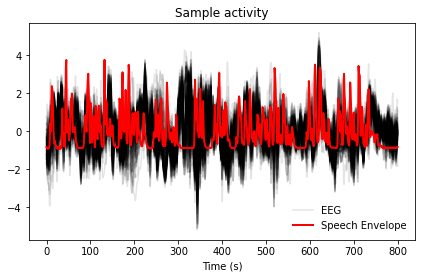

In [2]:
path = mne.datasets.mtrf.data_path()
decim = 2
datafile = loadmat(op.join(path, "speech_data.mat"))
raw = datafile["EEG"].T
speech = datafile["envelope"].T
sfreq = float(datafile["Fs"])
sfreq /= decim
speech = mne.filter.resample(speech, down=decim*2, npad="auto")
raw = mne.filter.resample(raw, down=decim, npad="auto")

# Read in channel positions and create our MNE objects from the raw data
montage = mne.channels.make_standard_montage("biosemi128")
info = mne.create_info(montage.ch_names, sfreq, "eeg").set_montage(montage)
raw = mne.io.RawArray(raw, info)
n_channels = len(raw.ch_names)

# Plot a sample of brain and stimulus activity
fig, ax = plt.subplots()
lns = ax.plot(scale(raw[:, :800][0].T), color="k", alpha=0.1)
ln1 = ax.plot(scale(speech[0, :800]), color="r", lw=2)
ax.legend([lns[0], ln1[0]], ["EEG", "Speech Envelope"], frameon=False)
ax.set(title="Sample activity", xlabel="Time (s)")
mne.viz.tight_layout()

In [3]:
data = raw.get_data()[None]

freq = np.linspace(1,15,15) 
rg   = 0.0005
Nc   = np.maximum(1, np.round(np.sqrt((2 * np.pi * freq / raw.info['sfreq'])**2 / (2*rg))))
Nc = 7
th_rg = (2 * np.pi * freq / raw.info['sfreq'])**2/ (2 * Nc**2)
print(Nc)
print(th_rg)

tfr  = mne.time_frequency.tfr_array_morlet(data, raw.info['sfreq'], freq, n_cycles=Nc, output='power', n_jobs=11, decim=2)
# tfr  = np.sqrt(tfr)
tfr  = tfr[:, :, :, :2*(tfr.shape[-1] // 2)]
tfr  = np.log(tfr)

7
[9.83498525e-05 3.93399410e-04 8.85148673e-04 1.57359764e-03
 2.45874631e-03 3.54059469e-03 4.81914277e-03 6.29439056e-03
 7.96633805e-03 9.83498525e-03 1.19003322e-02 1.41623788e-02
 1.66211251e-02 1.92765711e-02 2.21287168e-02]


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done   7 tasks      | elapsed:    0.9s
[Parallel(n_jobs=11)]: Done 105 tasks      | elapsed:    1.0s
[Parallel(n_jobs=11)]: Done 128 out of 128 | elapsed:    1.1s finished


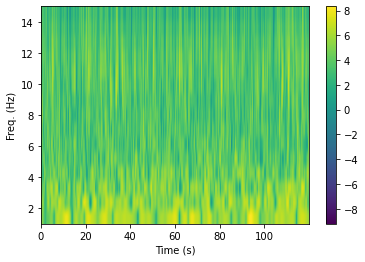

In [4]:
def plot_tfr(tfr, tvec, freq):
    extent = (tvec[0], tvec[-1], freq[0], freq[-1])

#     plt.subplot(2,1,1)
    plt.imshow(tfr[raw.ch_names.index('A9')], aspect="auto", origin="lower", extent=extent)
    plt.xlabel('Time (s)')
    plt.ylabel('Freq. (Hz)')
    plt.colorbar()
    
#     plt.subplot(2,1,2)
#     plt.imshow(tfr[2], aspect="auto", origin="lower", extent=extent)
#     plt.xlabel('Time (ms)')
#     plt.ylabel('Freq. (Hz)')
    
    plt.savefig('tfr_A9.pdf')
    
    plt.show()
    
plot_tfr(tfr[:].mean(0), raw.times, freq);
# plot_tfr(np.log(tfr[ Ifeet].mean(0)), epochs.times, freq)


In [5]:
fig = go.Figure()
fig.add_scatter(x=raw.times, y=data[0, raw.ch_names.index('A9')], mode='lines')
fig.update_layout(template='plotly_white', height=320, width=640)
fig.update_xaxes(title_text='Time (s)')
fig.update_yaxes(title_text='Voltage (uV)')

In [6]:
fbands = dict(
    delta = (freq[0], 4), 
    theta = (4, 8), 
    alpha = (8, 13),
    beta  = (13, 30), 
#     gamma = (30, freq[-1])
)

fbands = {f'{i:.0f}':(i, i+1) for i in freq}

idxs = {k: np.where(np.logical_and(freq >= fmin, freq < fmax))[0]
       for k, (fmin, fmax) in fbands.items()}
 
pband  = {k: tfr[:,:,idx].sum(2) for k, idx in idxs.items()} 
acfs   = {k: acf_welch(p) for k, p in pband.items()} 
rgs    = {k: estimate_roughness(p) for k, p in pband.items()}
th_rgs = {k: th_rg[idx].mean() for k, idx in idxs.items()}

ssq_th = dict()
ssq_ev = dict()

nlags = 50
for k, acf in acfs.items(): 
    
#     if k == 'delta': continue
        
    fig = go.Figure()
    
    rg = th_rgs[k]
        
    acf_recon = np.concatenate([acf[:,:,-nlags+1:],acf[:,:,:nlags+1]], axis=-1)
    lags      = np.arange(-nlags+1, nlags+1)
        
    n = acf.shape[-1]
    acf_sums  = acf[..., 0]**2 + np.sum(2 * np.arange(n-1, 0, -1) * acf[...,1:n] **2, -1) / n
    acf_fit   = np.exp(-  lags[None, None, :]**2 * (rgs[k][:,:, None]) / 2)
    
    print(f'{k}:\n' 
          f'    - sum of squares:     {acf_sums.mean():.2f} ({acf_sums.std():.2f})\n'
          f'    - known, theoretical: {np.sqrt(np.pi / (rg*4)):.2f}\n'
          f'    - knwon, sum of sq.:  {np.exp(- 4* lags**2 * (rg)  ).sum():.2f}\n'
          f'    - unkn., theoretical: {np.sqrt(np.pi/ rgs[k] ).mean():.2f}\n'
          f'    - unkn., sum of sq.:  {acf_fit.sum(-1).mean():.2f} ({acf_fit.sum(-1).std():.2f})\n')
#     plt.plot(lags, acf_recon**2)

    for i in range(acf.shape[0]):
        for j in range(acf.shape[1]):
            fig.add_scatter(x=lags, y=acf_recon[i,j]**2, showlegend=False, mode='lines', line_width=1, line_color='grey')
    
    fig.add_scatter(x=lags, y=acf_recon.mean((0,1))**2, showlegend=False, mode='lines', line_width=3, line_color='black')
    fig.add_scatter(x=lags, y=acf_fit.mean((0,1)), name='Gaussian fit',  showlegend=False, mode='lines', line_color='red', line_width=4, line_dash='dot')
    fig.add_annotation(x=35, y=1, text=f'Sum of squares: {acf_sums.mean():.2f} ({acf_sums.std():.2f})', showarrow=False) 
    fig.add_annotation(x=35, y=.9, text=f'Gaussian approx.: {np.sqrt(2* np.pi/ rgs[k] ).mean():.2f}', showarrow=False) 

#     fig.add_scatter(x=lags, y=np.exp(- 2* lags**2 * (rg) ), name='Gaussian fit',  showlegend=False, mode='lines', line_color='red', line_width=4, line_dash='dash')
    fig.update_layout(template='simple_white', height=400, width=600)
    
    fig.update_xaxes(title_text='Lag')
    fig.update_yaxes(title_text='Autocorrelation')
    fig.show()
    
    
    
    fig.write_image(f'freq_{k}_acf_fit.png')
    
    ssq_ev[k] = acf_sums.mean()
    ssq_th[k] = np.sqrt(2* np.pi/ rgs[k]).mean()

1:
    - sum of squares:     37.53 (3.88)
    - known, theoretical: 89.36
    - knwon, sum of sq.:  74.99
    - unkn., theoretical: 29.37
    - unkn., sum of sq.:  41.04 (9.81)



2:
    - sum of squares:     24.08 (2.36)
    - known, theoretical: 44.68
    - knwon, sum of sq.:  44.46
    - unkn., theoretical: 16.95
    - unkn., sum of sq.:  23.97 (4.10)



3:
    - sum of squares:     17.25 (1.26)
    - known, theoretical: 29.79
    - knwon, sum of sq.:  29.79
    - unkn., theoretical: 11.49
    - unkn., sum of sq.:  16.25 (2.01)



4:
    - sum of squares:     12.19 (0.69)
    - known, theoretical: 22.34
    - knwon, sum of sq.:  22.34
    - unkn., theoretical: 8.86
    - unkn., sum of sq.:  12.53 (1.18)



5:
    - sum of squares:     9.42 (0.59)
    - known, theoretical: 17.87
    - knwon, sum of sq.:  17.87
    - unkn., theoretical: 6.86
    - unkn., sum of sq.:  9.70 (0.74)



6:
    - sum of squares:     8.03 (0.54)
    - known, theoretical: 14.89
    - knwon, sum of sq.:  14.89
    - unkn., theoretical: 5.90
    - unkn., sum of sq.:  8.34 (0.58)



7:
    - sum of squares:     6.98 (0.43)
    - known, theoretical: 12.77
    - knwon, sum of sq.:  12.77
    - unkn., theoretical: 5.37
    - unkn., sum of sq.:  7.59 (0.37)



8:
    - sum of squares:     6.58 (0.76)
    - known, theoretical: 11.17
    - knwon, sum of sq.:  11.17
    - unkn., theoretical: 4.98
    - unkn., sum of sq.:  7.05 (0.39)



9:
    - sum of squares:     5.88 (0.45)
    - known, theoretical: 9.93
    - knwon, sum of sq.:  9.93
    - unkn., theoretical: 4.36
    - unkn., sum of sq.:  6.16 (0.27)



10:
    - sum of squares:     6.44 (0.91)
    - known, theoretical: 8.94
    - knwon, sum of sq.:  8.94
    - unkn., theoretical: 4.41
    - unkn., sum of sq.:  6.24 (0.49)



11:
    - sum of squares:     6.70 (1.18)
    - known, theoretical: 8.12
    - knwon, sum of sq.:  8.12
    - unkn., theoretical: 4.58
    - unkn., sum of sq.:  6.48 (0.61)



12:
    - sum of squares:     6.10 (1.04)
    - known, theoretical: 7.45
    - knwon, sum of sq.:  7.45
    - unkn., theoretical: 4.40
    - unkn., sum of sq.:  6.22 (0.66)



13:
    - sum of squares:     5.51 (0.77)
    - known, theoretical: 6.87
    - knwon, sum of sq.:  6.87
    - unkn., theoretical: 4.16
    - unkn., sum of sq.:  5.89 (0.47)



14:
    - sum of squares:     5.13 (0.59)
    - known, theoretical: 6.38
    - knwon, sum of sq.:  6.38
    - unkn., theoretical: 3.97
    - unkn., sum of sq.:  5.62 (0.27)



15:
    - sum of squares:     5.18 (0.58)
    - known, theoretical: 5.96
    - knwon, sum of sq.:  5.96
    - unkn., theoretical: 4.04
    - unkn., sum of sq.:  5.72 (0.26)



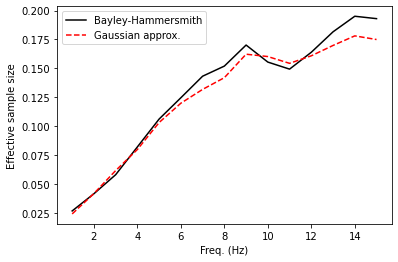

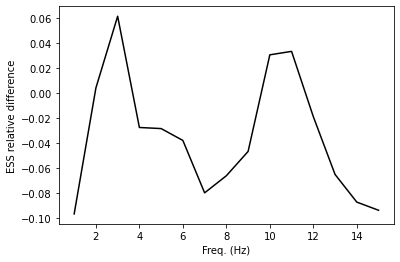

In [7]:
ess_ev = np.asarray([1/v for v in ssq_ev.values()])
ess_th = np.asarray([1/v for v in ssq_th.values()])


plt.plot(freq, ess_ev, 'k', freq, ess_th, 'r--')
plt.xlabel('Freq. (Hz)')
plt.ylabel('Effective sample size')
plt.legend(['Bayley-Hammersmith', 'Gaussian approx.'])
plt.savefig('ESS.pdf')
plt.show()

plt.plot(freq, ess_th/ess_ev - 1, 'k')
plt.xlabel('Freq. (Hz)')
plt.ylabel('ESS relative difference')

plt.savefig('ESS_difference.pdf')
plt.show()

In [9]:
eeg_speech_corr = spearman_r(tfr[0,:,:], speech)

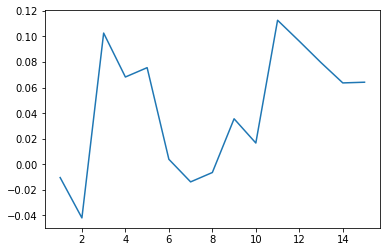

In [24]:
plt.plot(freq, eeg_speech_corr[raw.ch_names.index('A7')])

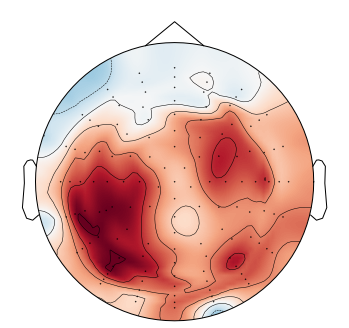

In [7]:
plt.rcParams['figure.figsize'] = (6,6)
mne.viz.plot_topomap(eeg_speech_corr.mean(1), raw.info, size=6); 

# for k, rs in pearson_rs.items():
#     mne.viz.plot_topomap(rs[0], raw.info, size=6)
#     plt.show()

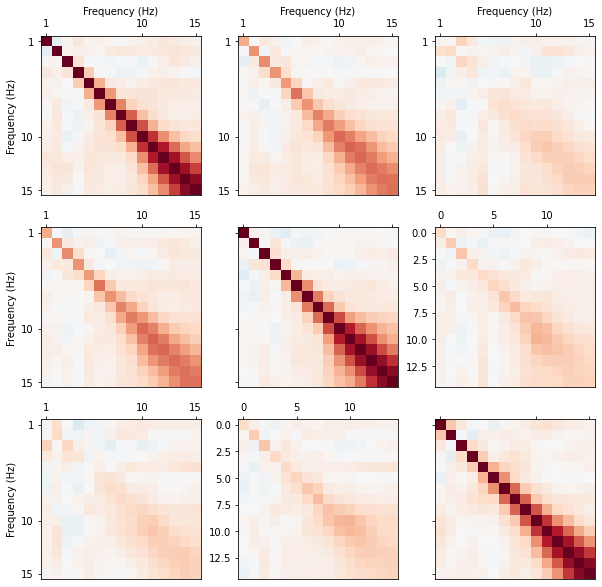

In [7]:
nc = 6
# ch_idx = np.argsort(np.abs(eeg_speech_corr).mean(1))[-nc//2:]
# ch_idx = np.concatenate([ch_idx, np.argsort(np.abs(eeg_speech_corr).mean(1))[:nc//2+1]])
# ch_names = [raw.ch_names[i] for i in ch_idx]

ch_names = ['D30', 'A18', 'B31']
nc = len(ch_names)
ch_idx = [raw.ch_names.index(ch) for ch in ch_names]

x = tfr[0, ch_idx, :, :] 

r = pearson_r(x[:, None, :, None], x[None, :, None, :])

vmin = r.min()
vmax = r.max()
vmin = -1
vmax = 1

f,axs = plt.subplots(nc,nc)
for i in range(nc):    
    plt.subplot(nc,nc,i+1 + i*nc)
#     plt.plot(freq, eeg_speech_corr[ch_idx[i]])
    
    plt.imshow(r[i,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#     plt.xticks([0, 9, 19], [1, 10, 20])
#     plt.yticks([0, 9, 19], [1, 10, 20])   
    
    axs[i, i].xaxis.set_ticks_position('top')   
    axs[i, i].xaxis.set_label_position('top')   
    plt.xticks([0, 9, 14], ['', '', ''])
    plt.yticks([0, 9, 14], ['', '', ''])
    
    if i == 0: 
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Frequency (Hz)')
        
        plt.xticks([0, 9, 14], [1, 10, 15])
        plt.yticks([0, 9, 14], [1, 10, 15])
        
    
    for j in range(nc):
        if j <= i: continue
            
        plt.subplot(nc,nc,j+1 + i*nc)
        plt.imshow(r[i,j], vmin=vmin, vmax=vmax, cmap='RdBu_r')
        
        
        axs[i, j].xaxis.set_ticks_position('top')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        if i == 0: 
            axs[i, j].xaxis.set_label_position('top')   
            plt.xlabel('Frequency (Hz)')
            
            plt.xticks([0, 9, 14], [1, 10, 15])
            plt.yticks([0, 9, 14], [1, 10, 15])
            
        plt.subplot(nc,nc,i+1 + j*nc)
        plt.imshow(r[j,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        axs[j, i].xaxis.set_ticks_position('top')
        
        if i == 0: 
            plt.ylabel('Frequency (Hz)')
            plt.xticks([0, 9, 14], [1, 10, 15])
            plt.yticks([0, 9, 14], [1, 10, 15])
    
    
    
f.set_figheight(10)
f.set_figwidth(10)
plt.savefig('coupling.png')

In [8]:
stats = stats_summary(pearson_r, x[:, None, :, None], x[None, :, None, :], n_surrogates=1024)

In [13]:
a = np.ones((10000, 3000)) / 3000
(a @ a.T)

/tmp/ipykernel_2686058/1462029141.py:2: RuntimeWarning:

invalid value encountered in matmul



array([[0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       ...,
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333],
       [0.00033333, 0.00033333, 0.00033333, ..., 0.00033333, 0.00033333,
        0.00033333]])

In [12]:
nc = 6
# ch_idx = np.argsort(np.abs(eeg_speech_corr).mean(1))[-nc//2:]
# ch_idx = np.concatenate([ch_idx, np.argsort(np.abs(eeg_speech_corr).mean(1))[:nc//2+1]])
# ch_names = [raw.ch_names[i] for i in ch_idx]

ch_names = ['D30', 'A18', 'B31']
nc = len(ch_names)
ch_idx = [raw.ch_names.index(ch) for ch in ch_names]

x = tfr[0, ch_idx, :, :] 

r = np.log10(stats['p']['rft']+ 1e-16)

vmin = r.min()
vmax = r.max()
# vmin = 0
# vmax = 1

f,axs = plt.subplots(nc,nc)
for i in range(nc):    
    plt.subplot(nc,nc,i+1 + i*nc)
#     plt.plot(freq, eeg_speech_corr[ch_idx[i]])
    
    plt.imshow(r[i,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#     plt.xticks([0, 9, 19], [1, 10, 20])
#     plt.yticks([0, 9, 19], [1, 10, 20])   
    
    axs[i, i].xaxis.set_ticks_position('top')   
    axs[i, i].xaxis.set_label_position('top')   
    plt.xticks([0, 9, 19], ['', '', ''])
    plt.yticks([0, 9, 19], ['', '', ''])
    
    if i == 0: 
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Frequency (Hz)')
        
        plt.xticks([0, 9, 19], [1, 10, 20])
        plt.yticks([0, 9, 19], [1, 10, 20])
        
    
    for j in range(nc):
        if j <= i: continue
            
        plt.subplot(nc,nc,j+1 + i*nc)
        plt.imshow(r[i,j], vmin=vmin, vmax=vmax, cmap='RdBu_r')
        
        
        axs[i, j].xaxis.set_ticks_position('top')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        if i == 0: 
            axs[i, j].xaxis.set_label_position('top')   
            plt.xlabel('Frequency (Hz)')
            
            plt.xticks([0, 9, 19], [1, 10, 20])
            plt.yticks([0, 9, 19], [1, 10, 20])
            
        plt.subplot(nc,nc,i+1 + j*nc)
        plt.imshow(r[j,i], vmin=vmin, vmax=vmax, cmap='RdBu_r')

#         plt.xticks([0, 9, 19], ['', '', ''])
#         plt.yticks([0, 9, 19], ['', '', ''])
        
        axs[j, i].xaxis.set_ticks_position('top')
        
        if i == 0: 
            plt.ylabel('Frequency (Hz)')
            plt.xticks([0, 9, 19], [1, 10, 20])
            plt.yticks([0, 9, 19], [1, 10, 20])
    
    
    
f.set_figheight(10)
f.set_figwidth(10)
plt.savefig('coupling.png')

NameError: name 'stats' is not defined

In [18]:
x

array([[[ 3.56036321,  3.56805853,  3.57349273, ...,  5.68643524,
          5.66147581,  5.63554732],
        [ 3.08280678,  3.19763025,  3.3167623 , ...,  5.6916281 ,
          5.7202527 ,  5.73920581],
        [ 4.50948957,  4.62321333,  4.7280106 , ...,  5.43318086,
          5.41022308,  5.38051967],
        ...,
        [ 3.4622767 ,  3.84029026,  4.07013754, ...,  4.71099125,
          4.89896464,  4.96301446],
        [ 3.48244506,  3.82771512,  3.98314653, ...,  4.39613169,
          4.70720639,  4.84510716],
        [ 3.36944771,  3.66810884,  3.73742105, ...,  3.85299418,
          4.33766296,  4.60182628]],

       [[ 4.73383628,  4.78630688,  4.84003465, ...,  6.33688194,
          6.31051274,  6.28289509],
        [ 4.258027  ,  4.24853859,  4.23952049, ...,  5.70670046,
          5.76666193,  5.81313431],
        [ 4.95194284,  4.99964566,  5.03572505, ...,  6.33688956,
          6.31134523,  6.27637977],
        ...,
        [ 4.07235021,  4.52643835,  4.76728088, ...,  

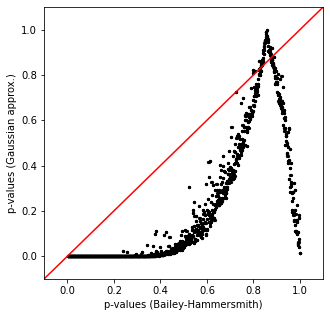

In [15]:
plt.rcParams['figure.figsize'] = (5,5)

plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(1 - rank(stats['r'].flatten()) / stats['r'].size, stats['p']['rft'].flatten(), c='k', s=5)
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.xlabel('p-values (Bailey-Hammersmith)')
plt.ylabel('p-values (Gaussian approx.)')


plt.savefig('bh_rft.pdf')

Text(0, 0.5, 'p-values (Gaussian approx.)')

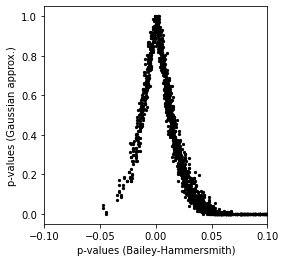

In [129]:
plt.rcParams['figure.figsize'] = (4,4)

# plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(stats['kappa']['rft'].flatten(), stats['ppng']['surrogates'].flatten(), c='k', s=5)
plt.xlim([-0.1,0.1])
# plt.ylim([-0.1,0.1])
plt.xlabel('p-values (Bailey-Hammersmith)')
plt.ylabel('p-values (Gaussian approx.)')


# plt.savefig('bh_rft.png')

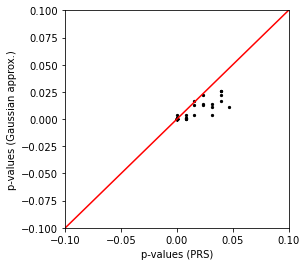

In [120]:
plt.rcParams['figure.figsize'] = (4,4)

plt.plot([-0.1,1.1],[-0.1,1.1], 'r')
plt.scatter(stats['p']['surrogates'][:,:,2:7,2:7].flatten(), stats['p']['rft'][:,:,2:7,2:7].flatten(), c='k', s=5)
plt.xlim([-0.1,0.1])
plt.ylim([-0.1,0.1])
plt.xlabel('p-values (PRS)')
plt.ylabel('p-values (Gaussian approx.)')


plt.savefig('bh_rft.png')

In [ ]:
pearson_rs  = {k: pearson_r(p, sqrt(speech[:, None, :])) for k, p in pband.items()}


In [ ]:
plt.rcParams['figure.figsize'] = (6,6)

for k, rs in pearson_rs.items():
    mne.viz.plot_topomap(rs[0], raw.info, size=6)
    plt.show()

In [ ]:
pearson_stats  = {k: stats_summary(pearson_r,  p, speech[:, None, :], n_surrogates=1000) for k, p in pband.items()}
# spearman_stats = {k: stats_summary(spearman_r, p[:, 0], p[:, 1], n_surrogates=1000) for k, p in pband.items()}

In [ ]:
for k, rs in pearson_stats.items():
    mne.viz.plot_topomap(rs['p']['surrogates'][0]-rs['p']['rft'][0], raw.info, size=6)
    plt.show()

In [ ]:
rs['p']['surrogates'][0] - 1.96 * np.sqrt(rs['p']['surrogates'][0] * (1-rs['p']['surrogates'][0]) / 1000)

In [ ]:
for k, rs in pearson_stats.items():

    r     = np.squeeze(rs['r'])
    ii    = np.argsort(r)
    psurr = rs['p']['bh'][0][ii]
    prft  = rs['p']['rft'][0][ii]

    nsurr = 1000
    ci95  = 1.96 * np.sqrt(psurr * (1-psurr) / nsurr)

    ci95x1 = psurr - ci95
    ci95x2 = psurr + ci95

    ci95x = np.concatenate([psurr - ci95, (psurr + ci95)[::-1]])
    ci95y = np.concatenate([prft, prft[::-1]])

#     plt.errorbar(psurr, prft, xerr=ci95, fmt='none', ecolor='r')
    plt.scatter(psurr, prft, s=10, c='k')
    plt.plot([-0,1],[-0,1],'k')
    plt.xlim([-0,1])
    plt.ylim([-0,1])
    plt.xlabel('Bailey-Hammerslay p-values')
    plt.ylabel('Our p-values')
    plt.show()

In [ ]:
pband['alpha'].shape

In [ ]:
plt.plot(pband['alpha'][0])